# Env setupu

In [1]:
import scanpy as sc, anndata as ad, numpy as np, pandas as pd
from scipy import sparse
from anndata import AnnData
from pandas.api.types import CategoricalDtype
from matplotlib import pylab
import warnings
import socket
import yaml
from sklearn.cluster import DBSCAN
import holoviews as hv
import scvelo as scv
import seaborn as sns
import os
import sys
import scanpy.external as sce
import matplotlib as plt

warnings.filterwarnings('ignore')

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
with open("../data/resources/rcParams.yaml") as f:
    rcParamsDict = yaml.full_load(f)
    for k in rcParamsDict["rcParams"]:
        print("{} {}".format(k,rcParamsDict["rcParams"][k]))
        plt.rcParams[k] = rcParamsDict["rcParams"][k]
    for k1 in set(list(rcParamsDict)).difference(set(["rcParams"])):
        print("{} {}".format(k1,rcParamsDict[k1]))

scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.22.2 scipy==1.6.2 pandas==1.2.3 scikit-learn==0.24.1 statsmodels==0.13.5 python-igraph==0.9.1 louvain==0.7.0 leidenalg==0.8.3
figure.dpi 80
savefig.dpi 500
figure.figsize [10, 10]
axes.facecolor None
figure.facecolor None
dotSize 20


# Configure paths

In [3]:
outdir = "../data/output"

with open("../data/resources/iPSC_lines_map.yaml", 'r') as f:
    iPSC_lines_map = yaml.load(f, Loader=yaml.FullLoader)["lines"]
colorsmap = dict(zip([i["newName"] for i in iPSC_lines_map.values()],[i["color"] for i in iPSC_lines_map.values()]))

# Filtered cells reprocess

In [4]:
adata  = sc.read_h5ad(outdir+"/adatas/ClusterAnnotated_Base_filt.h5ad")

# UMAP

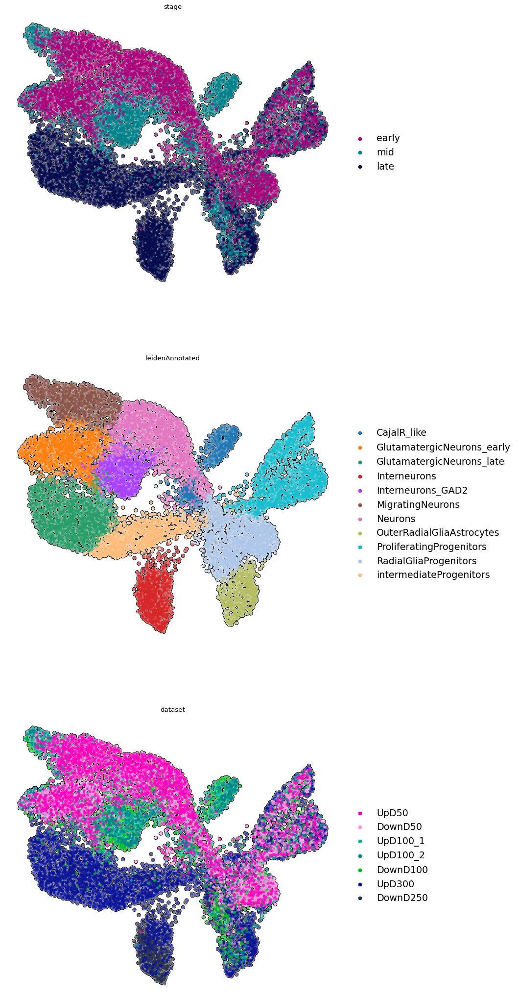

In [5]:
sc.pl.umap(adata, color=list(set(['leidenAnnotated',"dataset","stage"])), size = 100,add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98', wspace=.2, ncols=1, frameon=False, legend_fontsize="xx-large")

# DRAW graph

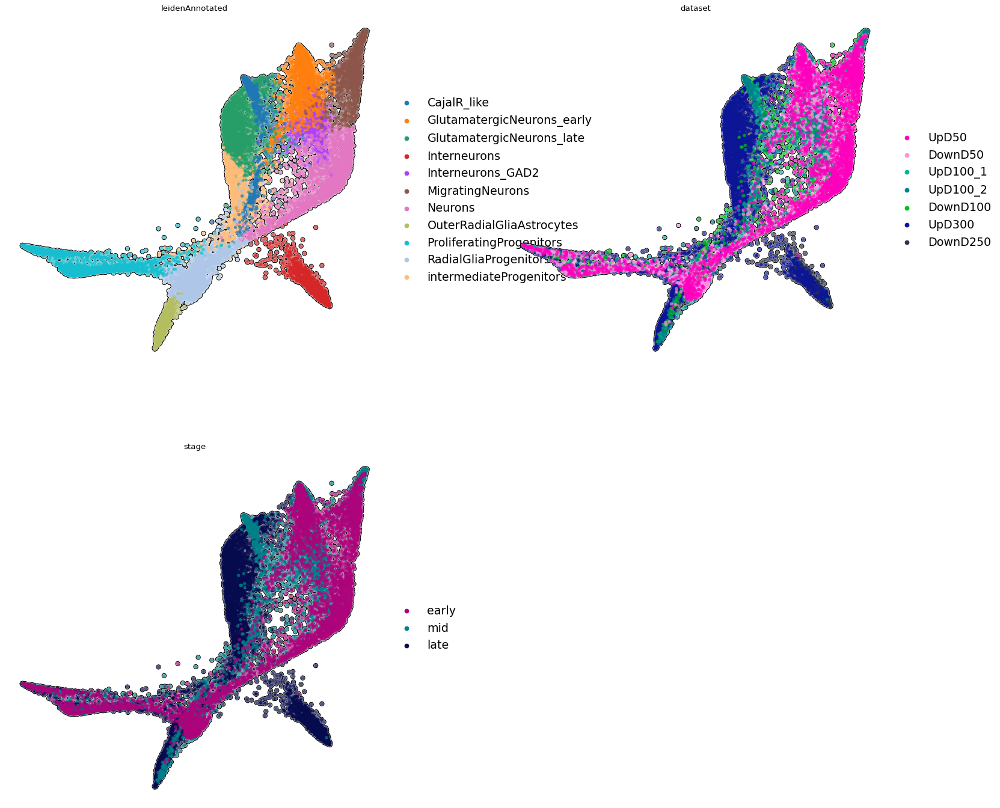

In [6]:
sc.pl.draw_graph(adata,color=["leidenAnnotated","dataset","stage"], size = 100,add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98', wspace=.2, ncols=2, frameon=False, legend_fontsize="xx-large")

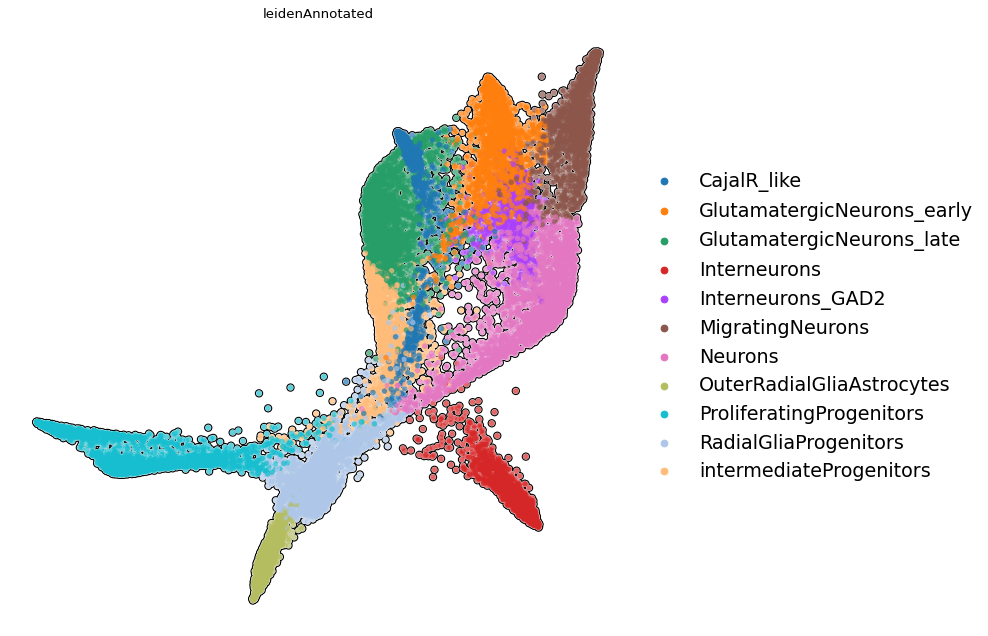

In [7]:
sc.pl.draw_graph(adata,color=["leidenAnnotated"], size = 100,add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98', wspace=.2, ncols=3,  frameon=False, legend_fontsize="xx-large")

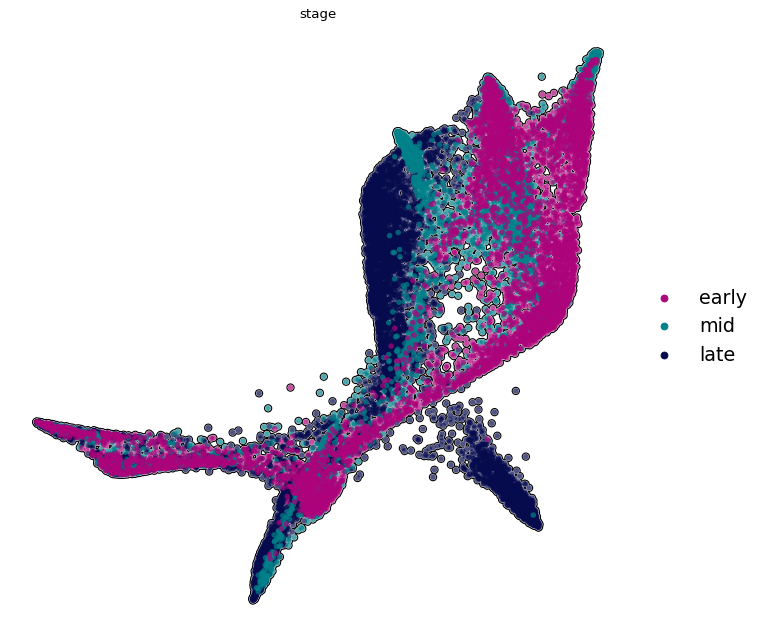

In [8]:
sc.pl.draw_graph(adata,color=["stage"], size = 100,add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98', wspace=.2, ncols=3,  frameon=False, legend_fontsize="xx-large")

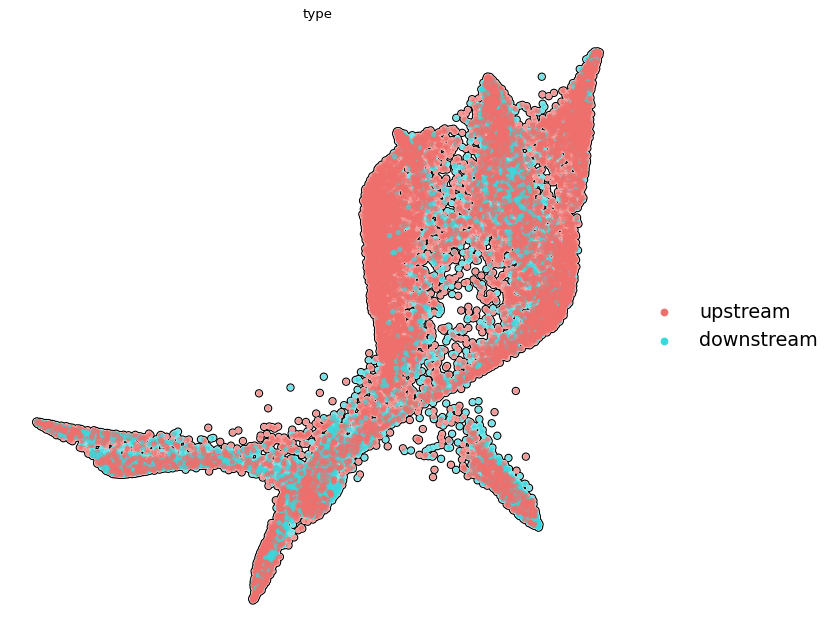

In [9]:
sc.pl.draw_graph(adata,color=["type"], size = 100,add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98', wspace=.2, ncols=3,  frameon=False, legend_fontsize="xx-large")

# Diffmap

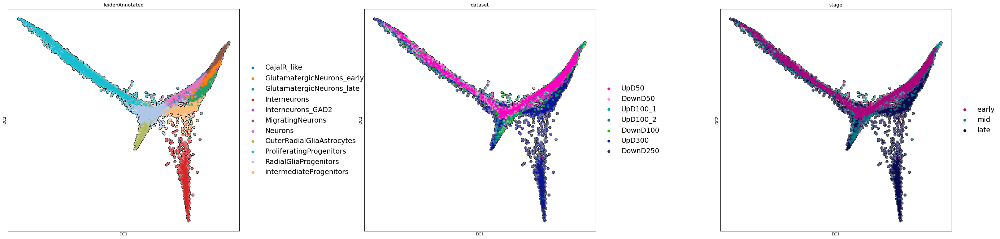

In [10]:
sc.pl.diffmap(adata,color=["leidenAnnotated","dataset","stage"], size = 100,add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98', wspace=.4, ncols=3, legend_fontsize="xx-large")

## Paga

running Leiden clustering
    finished: found 14 clusters and added
    'leiden_1.2', the cluster labels (adata.obs, categorical) (0:00:08)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:01)


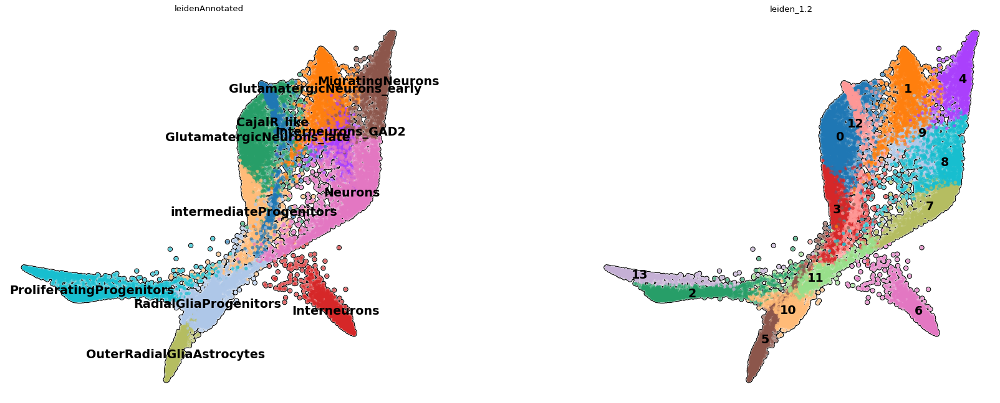

--> added 'pos', the PAGA positions (adata.uns['paga'])


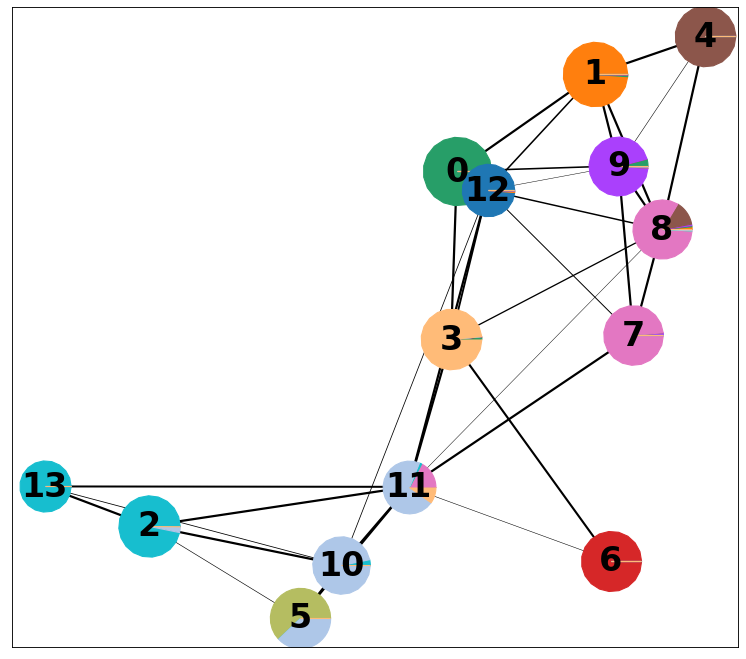

In [30]:
adataPaga = adata.copy()

leidenres = 1.2

sc.tl.leiden(adataPaga, resolution=leidenres, key_added="leiden_"+str(leidenres))

sc.tl.paga(adataPaga, groups="leiden_"+str(leidenres), use_rna_velocity=False)

groups="leiden_"+str(leidenres)
basis="X_draw_graph_fa"
if 'embeddings' in globals():
    del embeddings
for l in adataPaga.obs[groups].cat.categories:
    test=adataPaga.obsm[basis][adataPaga.obs[groups] == l]
    x=np.mean(test[:,0])
    y=np.mean(test[:,1])
    if not 'embeddings' in globals():
        embeddings = np.array([x,y])
    else:
        embeddings=np.vstack([embeddings,np.array([x,y])])

sc.pl.draw_graph(adataPaga, color = ["leidenAnnotated","leiden_"+str(leidenres)],ncols=2, 
           size = 100,add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98', legend_fontsize="xx-large", frameon=False, wspace=.3, legend_loc="on data")

thresholdPagaEdges = 0.05
sc.pl.paga(adataPaga, pos=embeddings, max_edge_width=2, threshold = thresholdPagaEdges, color = "leidenAnnotated", node_size_scale=20, save="Paga.svg", fontsize=30)

In [12]:
pd.crosstab(adataPaga.obs["leidenAnnotated"],adataPaga.obs["leiden_"+str(leidenres)]) / pd.crosstab(adataPaga.obs["leidenAnnotated"],adataPaga.obs["leiden_"+str(leidenres)]).sum(axis = 0)

leiden_1.2,0,1,2,3,4,5,6,7,8,9,10,11,12,13
leidenAnnotated,,,,,,,,,,,,,,
CajalR_like,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.987558,0.0
GlutamatergicNeurons_early,0.0,0.989049,0.000000,0.000876,0.007036,0.000000,0.000000,0.000000,0.014535,0.000981,0.000000,0.000000,0.007776,0.0
GlutamatergicNeurons_late,1.0,0.008214,0.000000,0.012259,0.000000,0.000898,0.000909,0.000000,0.006783,0.040236,0.000000,0.000000,0.001555,0.0
Interneurons,0.0,0.000000,0.000000,0.001751,0.000000,0.000000,0.999091,0.000000,0.000000,0.000000,0.000000,0.001529,0.000000,0.0
Interneurons_GAD2,0.0,0.001369,0.000000,0.000000,0.000000,0.000000,0.000000,0.015023,0.007752,0.949951,0.000000,0.000000,0.000000,0.0
MigratingNeurons,0.0,0.001369,0.000000,0.000000,0.992964,0.000000,0.000000,0.000000,0.134690,0.000981,0.000000,0.000000,0.000000,0.0
Neurons,0.0,0.000000,0.000000,0.000876,0.000000,0.000000,0.000000,0.984977,0.828488,0.006869,0.000000,0.172783,0.003110,0.0
OuterRadialGliaAstrocytes,0.0,0.000000,0.000000,0.000000,0.000000,0.619946,0.000000,0.000000,0.000000,0.000000,0.003250,0.000000,0.000000,0.0
ProliferatingProgenitors,0.0,0.000000,0.968280,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.029252,0.013761,0.000000,1.0


[13, 2, 10, 11, 3, 0]


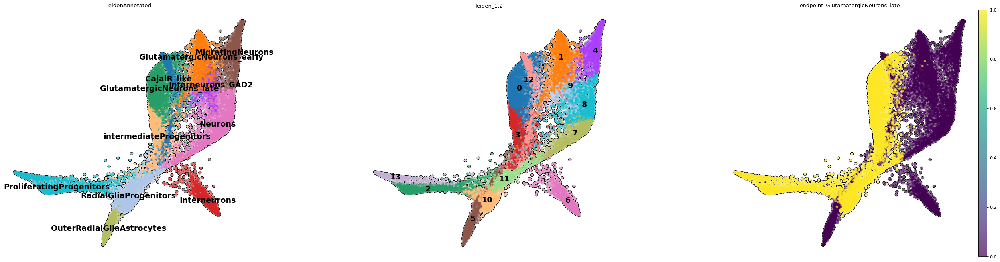

[13, 2, 10, 11, 7, 8, 1]


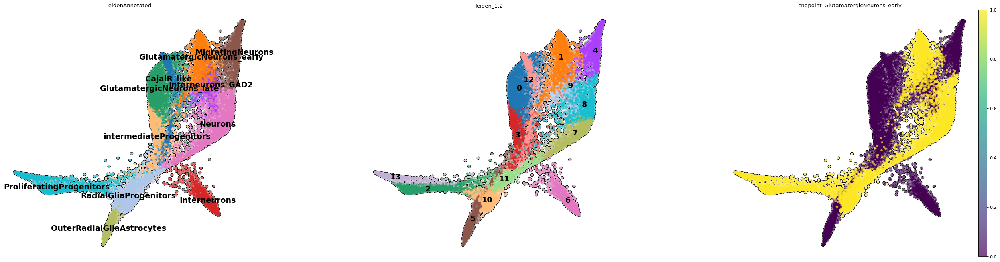

[13, 2, 10, 11, 7, 8, 4]


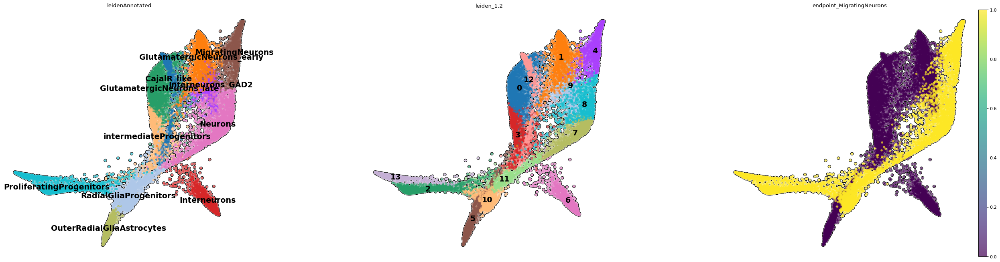

[13, 2, 10, 5]


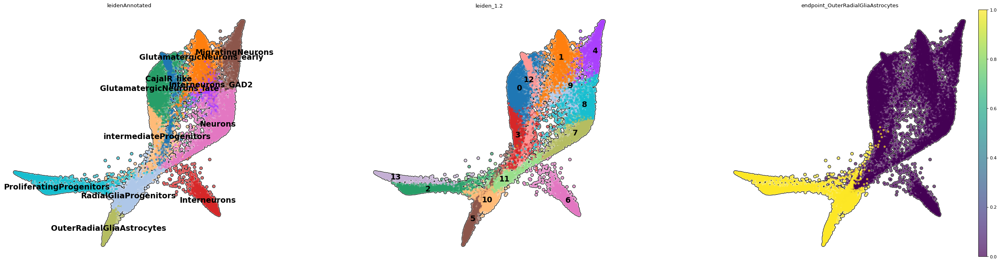

[13, 2, 10, 11, 6]


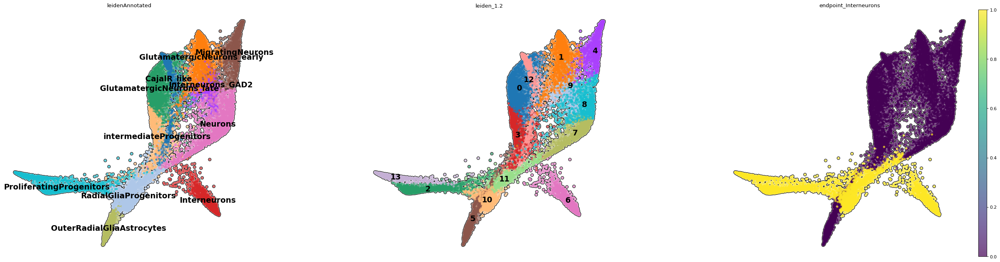

[13, 2, 10, 11, 7, 8, 9]


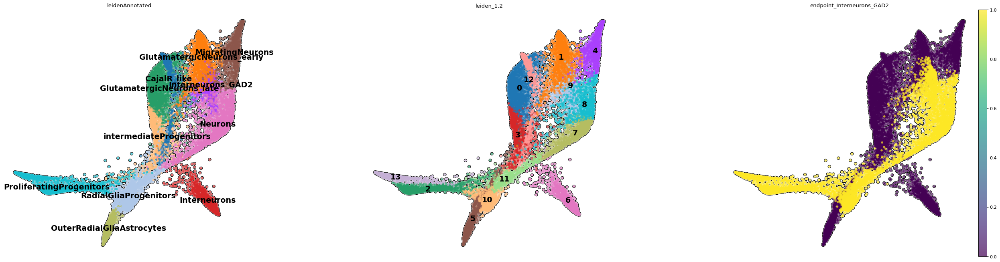

[13, 2, 10, 11, 12]


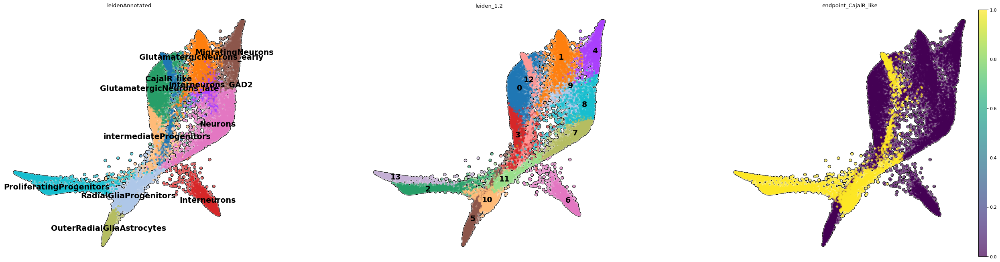

In [13]:
## Shortest paths



# Setting terminal states from leiden + annotation
endPointsList = ["GlutamatergicNeurons_late",
 "Interneurons",
 "Interneurons_GAD2",
 "GlutamatergicNeurons_early",
 "CajalR_like",
 "MigratingNeurons",
"OuterRadialGliaAstrocytes"
]



endPointsMap = pd.crosstab(adataPaga.obs["leidenAnnotated"],adataPaga.obs["leiden_"+str(leidenres)]) / pd.crosstab(adataPaga.obs["leidenAnnotated"],adataPaga.obs["leiden_"+str(leidenres)]).sum(axis = 0)
endPointsMap = endPointsMap.idxmax().to_dict()
endPointsMap = dict((v,int(k)) for k,v in endPointsMap.items() if v in endPointsList)
endPointsMap

#endPointsMap = {
# "GlutamatergicNeurons_early":3,
#"GlutamatergicNeurons_late":1,
#}

TOP2Aadata = adataPaga[:,"TOP2A"].copy()
TOP2Aadata.obs["TOP2A"] = TOP2Aadata.X.flatten()
root = int(TOP2Aadata.obs.groupby("leiden_"+str(leidenres))["TOP2A"].mean().idxmax())
del TOP2Aadata




import networkx as nx
testGraph = nx.from_numpy_matrix(adataPaga.uns["paga"]["connectivities"].todense(), parallel_edges=False, create_using=None )
testGraph.remove_edges_from([(n1, n2) for n1, n2, w in testGraph.edges(data="weight") if w < thresholdPagaEdges])
for t in testGraph.edges(data="weight"):
    testGraph[t[0]][t[1]]["weight"] = 1-t[2]

for endpoint in list(endPointsMap.keys()):
    sp = nx.shortest_path(testGraph, source=root, target=endPointsMap[endpoint], weight="weight", method='bellman-ford')
    print(sp)
    #adataMilo_vel.obs["endpoint_"+endpoint] = False
    adataPaga.obs["endpoint_"+str(endpoint)] = adataPaga.obs["leiden_"+str(leidenres)].astype(int).isin(sp).astype(int)
    #pd.DataFrame(adataPaga[adataPaga.obs["endpoint_"+str(endpoint)] == 1].obs_names, columns=["barcode"]).to_csv(outdir+"/"+endpoint+".PagaTest_copy.tsv", )
    sc.pl.draw_graph(adataPaga, color = ["leidenAnnotated","leiden_"+str(leidenres),"endpoint_"+str(endpoint)],ncols=3, 
           size = 100,add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98', legend_fontsize="xx-large", frameon=False, wspace=.3, legend_loc="on data")

# Excs Both

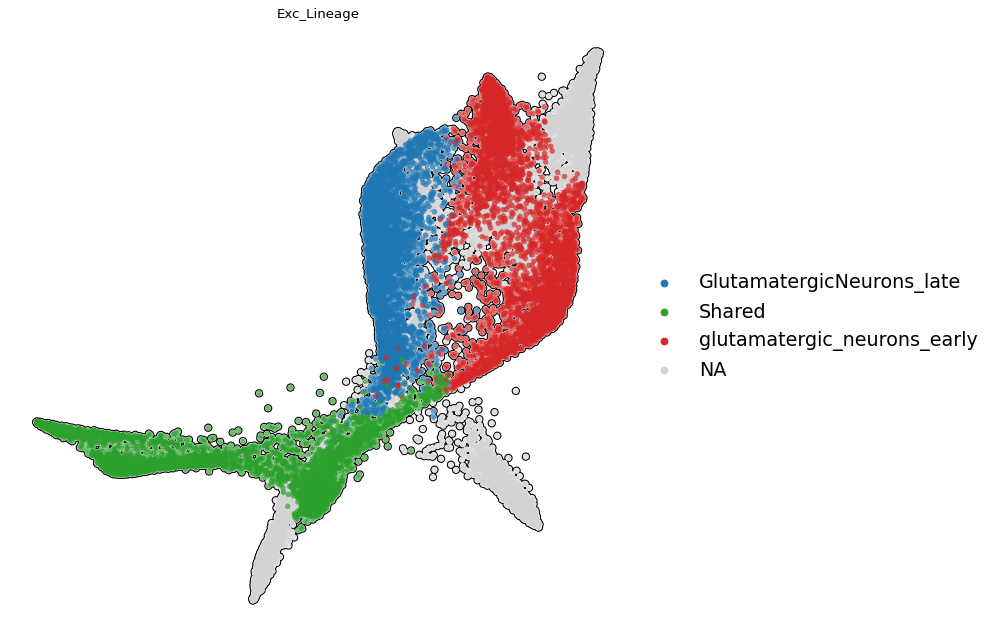

In [14]:
adataPaga.obs["Exc_Lineage"] = "Other"
adataPaga.obs.loc[adataPaga.obs["endpoint_GlutamatergicNeurons_late"] == 1,"Exc_Lineage"] = "GlutamatergicNeurons_late"
adataPaga.obs.loc[adataPaga.obs["endpoint_GlutamatergicNeurons_early"] == 1,"Exc_Lineage"] = "glutamatergic_neurons_early"
adataPaga.obs.loc[adataPaga.obs["endpoint_GlutamatergicNeurons_late"] + adataPaga.obs["endpoint_GlutamatergicNeurons_early"] > 1,"Exc_Lineage"] = "Shared"
sc.pl.draw_graph(adataPaga, color = ["Exc_Lineage"],ncols=3, 
    size = 100,add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98', legend_fontsize="xx-large", frameon=False, wspace=.3, groups=["GlutamatergicNeurons_late","glutamatergic_neurons_early","Shared"], color_map="magma")              

In [15]:
adata.uns.keys()

dict_keys(['cellID_colors', 'cellID_newName_colors', 'cellID_newName_type_colors', 'cluster_colors', 'dataset_colors', 'diffmap_evals', 'draw_graph', 'leiden', 'leidenAnnotated_colors', 'leiden_Filt_colors', 'leiden_colors', 'neighbors', 'pca', 'phase_colors', 'score_filt', 'stage_colors', 'type_colors', 'umap'])

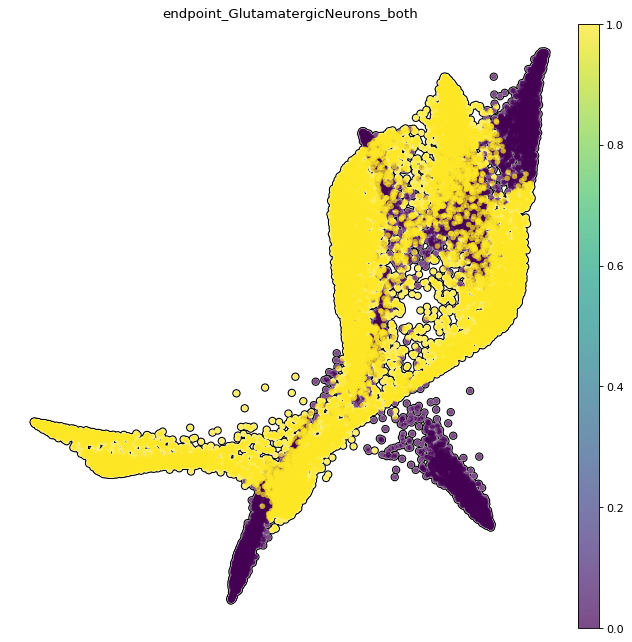

In [16]:
adataPaga.obs.loc[:,"endpoint_GlutamatergicNeurons_both"] = 0
adataPaga.obs.loc[adataPaga.obs["endpoint_GlutamatergicNeurons_late"] + adataPaga.obs["endpoint_GlutamatergicNeurons_early"] >= 1,"endpoint_GlutamatergicNeurons_both"] = 1
sc.pl.draw_graph(adataPaga, color = ["endpoint_GlutamatergicNeurons_both"],ncols=3,legend_loc=None, 
           size = 100,add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98', legend_fontsize="xx-large",save = "Exc_lineages.svg", frameon=False)

# Astrocytes

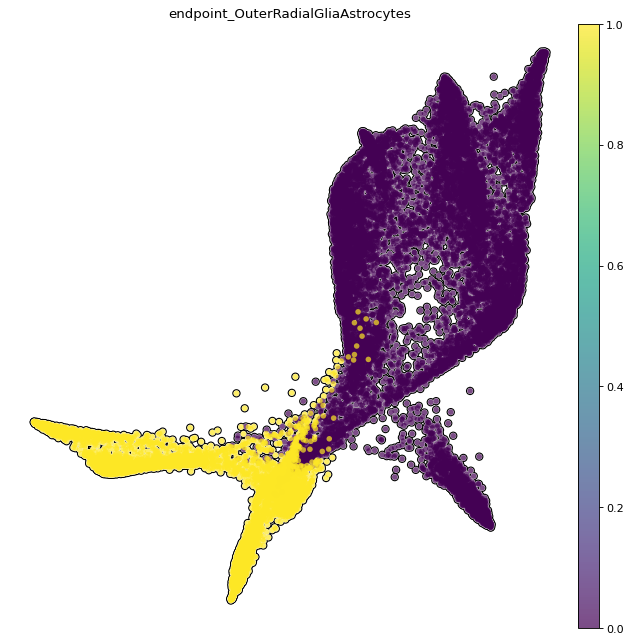

In [17]:
sc.pl.draw_graph(adataPaga, color = ["endpoint_OuterRadialGliaAstrocytes"],
           size = 100,add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98', legend_fontsize="xx-large", 
                 frameon=False,  save = "Astro_lineages.svg",  legend_loc="on data")

# Interneurons

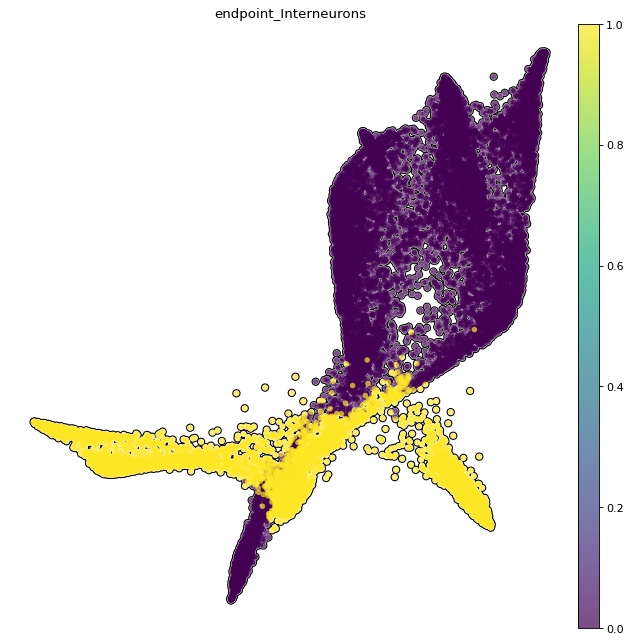

In [18]:
sc.pl.draw_graph(adataPaga, color = ["endpoint_Interneurons"],size = 100,add_outline=True, outline_width=(0.2, 0.05), vmin='p2',vmax='p98', legend_fontsize="xx-large", frameon=False,save = "Interneurons_lineages.svg", legend_loc="on data")

# Cajal R cells

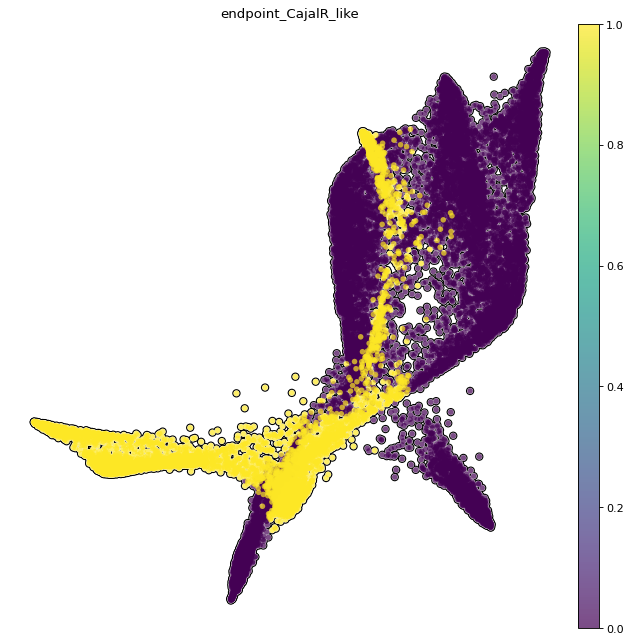

In [19]:
sc.pl.draw_graph(adataPaga, color = ["endpoint_CajalR_like"],
           size = 100,add_outline=True,save = "Cajal_lineages.svg", outline_width=(0.2, 0.05), vmin='p2',vmax='p98', legend_fontsize="xx-large", frameon=False,  legend_loc="on data")

# Migrarting neurons

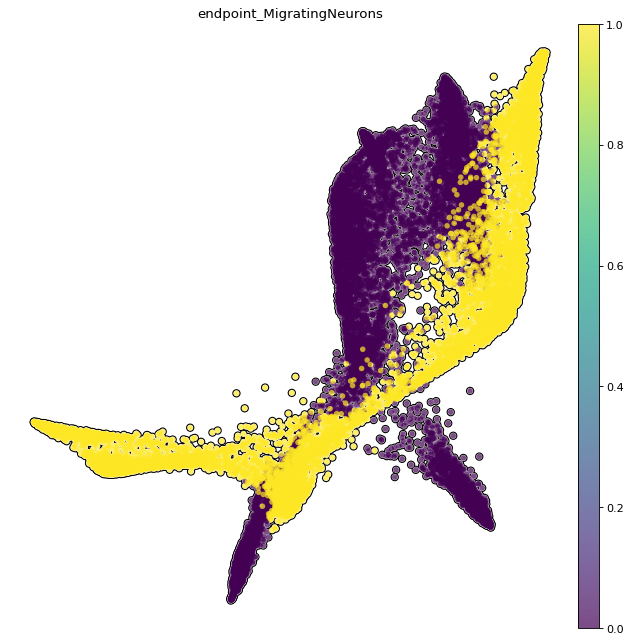

In [20]:
sc.pl.draw_graph(adataPaga, color = ["endpoint_MigratingNeurons"],
           size = 100,add_outline=True, outline_width=(0.2, 0.05), save = "Migrating_lineages.svg", vmin='p2',vmax='p98', legend_fontsize="xx-large", frameon=False, wspace=.3, legend_loc="on data")

In [21]:
adataPaga.write_h5ad(outdir+'/adatas/adataPaga.h5ad')

In [22]:
adataPagaRaw = sc.read_h5ad(outdir+'/adatas/MultiplexingPreprocessing_unscaled.h5ad')[adataPaga.obs_names]

In [23]:
adataPagaRaw.obs = adataPaga.obs

In [24]:
adataPagaRaw.write_h5ad(outdir+'/adatas/adataPagaRaw.h5ad')